In [7]:
# Основные библиотеки
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

# Обработка текста
import re
from collections import Counter, defaultdict
import string

# NLP библиотеки
try:
    import spacy
    nlp = spacy.load('ru_core_news_sm')
    SPACY_AVAILABLE = True
except:
    SPACY_AVAILABLE = False
    print("⚠️ Русская модель SpaCy недоступна. Некоторые NLP функции будут ограничены.")

# Библиотеки для сходства и машинного обучения
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Нечеткое сопоставление
from rapidfuzz import fuzz, process
from fuzzywuzzy import fuzz as fuzz_wuzzy

# Визуализация
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode(connected=True)

# Импорты проекта SAMe
import sys
sys.path.append('../../src')

try:
    from same.data_manager import data_helper
    from same.text_processing.text_cleaner import TextCleaner, CleaningConfig
    from same.text_processing.lemmatizer import Lemmatizer, LemmatizerConfig
    from same.text_processing.normalizer import TextNormalizer, NormalizerConfig
    SAME_MODULES_AVAILABLE = True
    print("✅ Модули SAMe успешно загружены")
except ImportError as e:
    SAME_MODULES_AVAILABLE = False
    print(f"⚠️ Модули SAMe недоступны: {e}")

# Конфигурация
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

print("🚀 Настройка завершена успешно!")

✅ Модули SAMe успешно загружены
🚀 Настройка завершена успешно!


In [37]:
data = pd.read_excel(data_helper["data"] / "output/analog_analysis_report_20250725_205544.xlsx")
print(len(data))


137745


In [9]:
data.head()

,Raw_Name,Cleaned_Name,Lemmatized_Name,Normalized_Name,Candidate_Name,Similarity_Score,Relation_Type,Final_Decision,Comment
0,Задвижка шиберная межфланцевая двусторонняя DN...,Задвижка шиберная межфланцевая двусторонняя DN...,задвижка шиберный межфланцевая двусторонний dn...,Задвижка шиберная межфланцевая двусторонняя DN...,Задвижка шиберная межфланцевая двусторонняя DN...,0.998,дубль,Дубликат - объединить,Высокая схожесть; Одинаковые категории; Поиско...
1,"Муфта поплавковая Avrora 111-SG-168-150,4-ОТТГ...","Муфта поплавковая Avrora 111-SG-168-150,4-ОТТГ...",муфта поплавковый avrora num>-sg-<num>-<num>-о...,Муфта поплавковая Avrora <NUM>-SG-<NUM>-<NUM>-...,"Муфта поплавковая Avrora 111-SG-245-226,6-ОТТГ...",0.998,дубль,Дубликат - объединить,Высокая схожесть; Одинаковые категории; Поиско...
2,"Муфта поплавковая Avrora 111-SG-245-226,6-ОТТГ...","Муфта поплавковая Avrora 111-SG-245-226,6-ОТТГ...",муфта поплавковый avrora num>-sg-<num>-<num>-о...,Муфта поплавковая Avrora <NUM>-SG-<NUM>-<NUM>-...,"Муфта поплавковая Avrora 111-SG-168-150,4-ОТТГ...",0.998,дубль,Дубликат - объединить,Высокая схожесть; Одинаковые категории; Поиско...
3,"Модуль порошкового пожаротушения МПП(Н)-2,5-КД...","Модуль порошкового пожаротушения МПП(Н)-2,5-КД...",порошковый пожаротушение мпп(н)-<num>-кд1-<num...,Модуль порошкового пожаротушения МПП(Н)-<NUM>-...,Модуль порошкового пожаротушения МПП(Н)-12-КД-...,0.998,дубль,Дубликат - объединить,Высокая схожесть; Одинаковые категории; Поиско...
4,Фильтр бурильной колонны ФБК-Н-102/108- К2 ТУ ...,Фильтр бурильной колонны ФБК-Н-102 108- К2 ТУ ...,фильтр бурильный колонна фбк н-<num num>- к2 n...,Фильтр бурильной колонны ФБК-Н-<NUM> <NUM>- К2...,Фильтр бурильной колонны ФБК-Н-127/133-К2 ТУ 2...,0.998,дубль,Дубликат - объединить,Высокая схожесть; Одинаковые категории; Поиско...


In [10]:
data["Relation_Type"].unique()

array(['дубль', 'близкий аналог', 'аналог', 'возможный аналог',
       'похожий товар'], dtype=object)

In [16]:
fig = px.histogram(data, x="Relation_Type", color="Relation_Type", title="Распределение типов отношений",
                   category_orders={"Relation_Type": ["дубль", "аналог", "близкий аналог", "возможный аналог", "похожий товар"]})
fig.show()
print(len(data))

137745


In [19]:
unique_names = data["Raw_Name"].unique()

print(len(unique_names))
avg_analog = len(data) / len(unique_names)
print(f"Среднее количество аналогов на товар: {avg_analog:.2f}")
max_analog = data.groupby("Raw_Name").size().max()
print(f"Максимальное количество аналогов на товар: {max_analog}")

128145
Среднее количество аналогов на товар: 1.07
Максимальное количество аналогов на товар: 23


In [ ]:
max_name_count = data.groupby("Raw_Name").size().idxmax()
flag_duble = False

print(f"Наименование с максимальным количеством аналогов: {max_name_count}")
for i, row in data[data["Raw_Name"] == max_name_count].iterrows():
    if row["Relation_Type"] == "дубль" and not flag_duble:
        print("Дубликаты:")
        flag_duble = True
    elif row["Relation_Type"] == "дубль" and flag_duble:
        continue
    else:
        print("Аналоги:")
    print(f"{i}. {row['Candidate_Name']}", end=" ")
    print(f"  Схожесть: {row['Similarity_Score']}", end=" ")
    print(f"  Тип связи: {row['Relation_Type']}", end=" ")
    print(f"  Комментарий: {row['Comment']}")

Наименование с максимальным количеством аналогов: Выключатель автоматический модульный ВА47-100-3С80-УХЛ3-КЭАЗ 141629
Дубликаты:
26193. ДУБЛИКАТ: 22 записей   Схожесть: 1.0   Тип связи: дубль   Комментарий: Точный дубликат, найдено 22 записей
Аналоги:
91405. Выключатель автоматический ВА47-100-3С100-УХЛ3-КЭАЗ   Схожесть: 0.836   Тип связи: аналог   Комментарий: Средняя схожесть; Одинаковые категории; Поисковый скор: 0.836


In [47]:
for i, row in data.iterrows():
    if row["Raw_Name"] == "Выключатель автоматический модульный ВА47-100-3С80-УХЛ3-КЭАЗ 141629":
        print(row["Candidate_Name"])
        print(row["Relation_Type"])
        print(row["Comment"])

ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 записей
ДУБЛИКАТ: 22 записей
дубль
Точный дубликат, найдено 22 

In [46]:
for i, row in data.iterrows():
    if row["Raw_Name"] == "Выключатель автоматический ВА47-100-3С100-УХЛ3-КЭАЗ":
        print(row["Candidate_Name"])
        print(row["Relation_Type"])
        print(row["Comment"])

Выключатель автоматический модульный ВА47-100-3С80-УХЛ3-КЭАЗ 141629
близкий аналог
Высокая схожесть; Одинаковые категории; Поисковый скор: 0.919


In [41]:
data.groupby("Raw_Name").size()

Raw_Name
 Крем Тор  защитный для кожи рук и лица гидрофильного действия 100 сл    1
 Кресло для посетителей экокожа, цвет черный, полозья хром,  RT-04S      1
 Образец вязкости жидкости, бутыль 500 мл, РЭВ-10000 ГСО 9508-2009       1
 Переход с ПП на чугун(тапер) D110/124мм с манжетом ( комплект)          1
 Пистолет для выдавливания герметика 310 мл                              1
                                                                        ..
рН-полоски с диапазоном 0-14                                             1
резак                                                                    1
с/у сульфат марганца 10г                                                 1
сетка затеняющая 40,6*10 для теплиц                                      1
углошлифовальная машина                                                  1
Length: 128145, dtype: int64

In [33]:
len(list(filter(lambda x: x > 1, data.groupby("Raw_Name").size())))


8473

In [ ]:
statistics = {}

for i, row in data.iterrows():
    


,Relation_Type,Count,Percentage
0,аналог,35653,25.88
1,близкий аналог,32154,23.34
2,возможный аналог,12018,8.72
3,дубль,55335,40.17
4,похожий товар,2585,1.88


/var/folders/h8/fhfvbn0j38nd4r3z3s719g1m0000gn/T/ipykernel_31164/2344766758.py:4: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


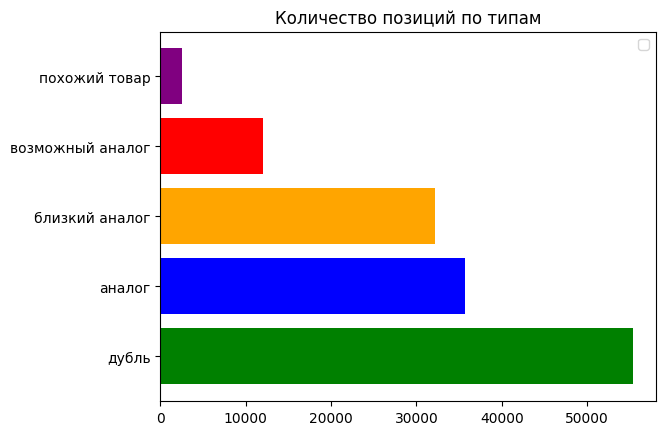

In [ ]:
# Создание визуализаций для оценки качества
fig = make_subplots(
    rows=2, cols=2,
    subplot_titles=('Пропущенные данные по столбцам', 'Распределение типов данных', 
                   'Анализ дубликатов', 'Полнота столбцов'),
    specs=[[{"type": "bar"}, {"type": "pie"}],
           [{"type": "bar"}, {"type": "bar"}]]
)

# График пропущенных данных
if len(quality_df) > 0:
    fig.add_trace(
        go.Bar(x=quality_df.index, y=quality_df['Процент_пропусков'],
               name='Пропуски %', marker_color='red'),
        row=1, col=1
    )

# Распределение типов данных
dtype_counts = df.dtypes.value_counts()
fig.add_trace(
    go.Pie(labels=dtype_counts.index.astype(str), values=dtype_counts.values,
           name="Типы данных"),
    row=1, col=2
)

# График дубликатов
if MAIN_NAME_COL and MAIN_NAME_COL in df.columns:
    # Подготовка данных для анализа дубликатов
    clean_names_for_viz = df[MAIN_NAME_COL].dropna().astype(str)
    clean_names_for_viz = clean_names_for_viz[clean_names_for_viz.str.strip() != '']
    
    if len(clean_names_for_viz) > 0:
        duplicate_counts = clean_names_for_viz.value_counts()
        duplicate_stats = {
            'Уникальные': sum(duplicate_counts == 1),
            'Дубликаты (2-5)': sum((duplicate_counts >= 2) & (duplicate_counts <= 5)),
            'Дубликаты (6-10)': sum((duplicate_counts >= 6) & (duplicate_counts <= 10)),
            'Дубликаты (>10)': sum(duplicate_counts > 10)
        }
        
        fig.add_trace(
            go.Bar(x=list(duplicate_stats.keys()), y=list(duplicate_stats.values()),
                   name='Дубликаты', marker_color='orange'),
            row=2, col=1
        )

# Полнота столбцов
completeness = ((len(df) - missing_data) / len(df)) * 100
fig.add_trace(
    go.Bar(x=df.columns, y=completeness,
           name='Полнота %', marker_color='green'),
    row=2, col=2
)

fig.update_layout(height=800, showlegend=False, title_text="Панель оценки качества данных")
fig.show()